In [1]:
import os
import re
from scipy import ndimage, misc
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv2

import tensorflow as tf
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
import tensorflow as tf
import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
np. random. seed(0)
print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.17.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
import cv2 as cv2
import numpy as np
from tqdm import tqdm
import os

# Function for tone mapping (Adaptive Histogram Equalization)
def apply_tone_mapping(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l_channel, a_channel, b_channel = cv2.split(lab)

    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to the L-channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l_channel)

    # Merge the channels back and convert to RGB
    merged = cv2.merge((cl, a_channel, b_channel))
    tone_mapped_img = cv2.cvtColor(merged, cv2.COLOR_LAB2RGB)
    return tone_mapped_img

# Function for skew correction
def correct_skew(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = cv2.bitwise_not(gray)

    # Use moments to calculate skew angle
    coords = np.column_stack(np.where(gray > 0))
    angle = cv2.minAreaRect(coords)[-1]

    # Correct the angle
    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle

    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    # Rotate the image to correct the skew
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    corrected_img = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return corrected_img

def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

# Defining the size of the image
SIZE = 256
n = 1800
high_img = []
low_img = []
path = '/content/input_data'
files = os.listdir(path)[:n]
files = sorted_alphanumeric(files)

for i in tqdm(files):
    img = cv2.imread(path + '/' + i, 1)
    # OpenCV reads images in BGR format so we have to convert it to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resizing image
    img_high = cv2.resize(img, (SIZE, SIZE))
    img_low = cv2.resize(img_high, (SIZE // 4, SIZE // 4))
    img_low = cv2.resize(img_low, (SIZE, SIZE))

    # Apply tone mapping
    img_high = apply_tone_mapping(img_high)
    img_low = apply_tone_mapping(img_low)

    # Apply skew correction
    img_high = correct_skew(img_high)
    img_low = correct_skew(img_low)

    # Normalizing images
    img_high = img_high.astype('float32') / 255.0
    img_low = img_low.astype('float32') / 255.0

    high_img.append(img_to_array(img_high))
    low_img.append(img_to_array(img_low))


100%|██████████| 1000/1000 [00:26<00:00, 38.04it/s]


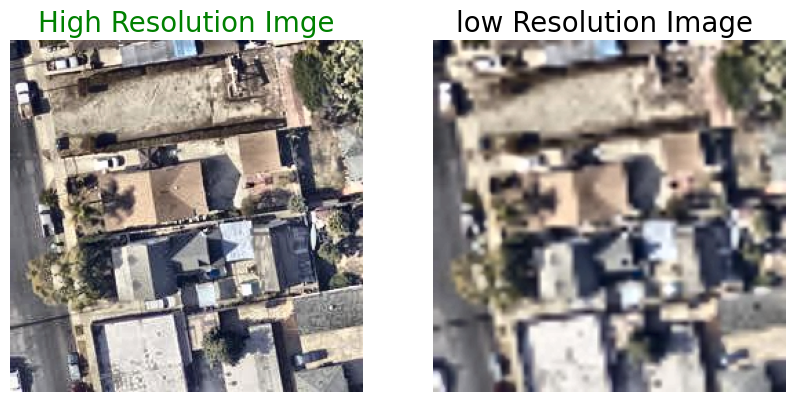

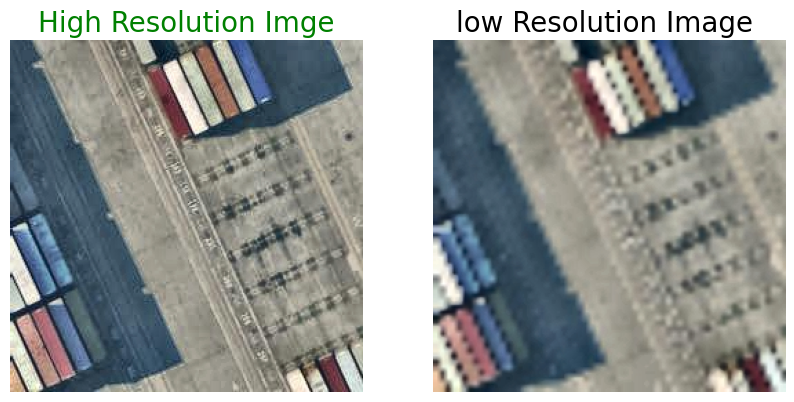

In [3]:
for i in range(2):
    a = np.random.randint(0,855)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')


In [4]:
train_high_image = high_img[:3000]
train_low_image = low_img[:3000]
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[:1000]
validation_low_image = low_img[:1000]
validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[:1200]
test_low_image = low_img[:1200]
test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)

Shape of training images: (1000, 256, 256, 3)
Shape of test images: (1000, 256, 256, 3)
Shape of validation images: (1000, 256, 256, 3)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 256, 256, 64)        │          15,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 256, 256, 32)        │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 256, 256, 3)         │           2,403 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,099 (78.51 KB)

 Trainable params: 20,099 (78.51 KB)

 Non-trainable params: 0 (0.00 B)

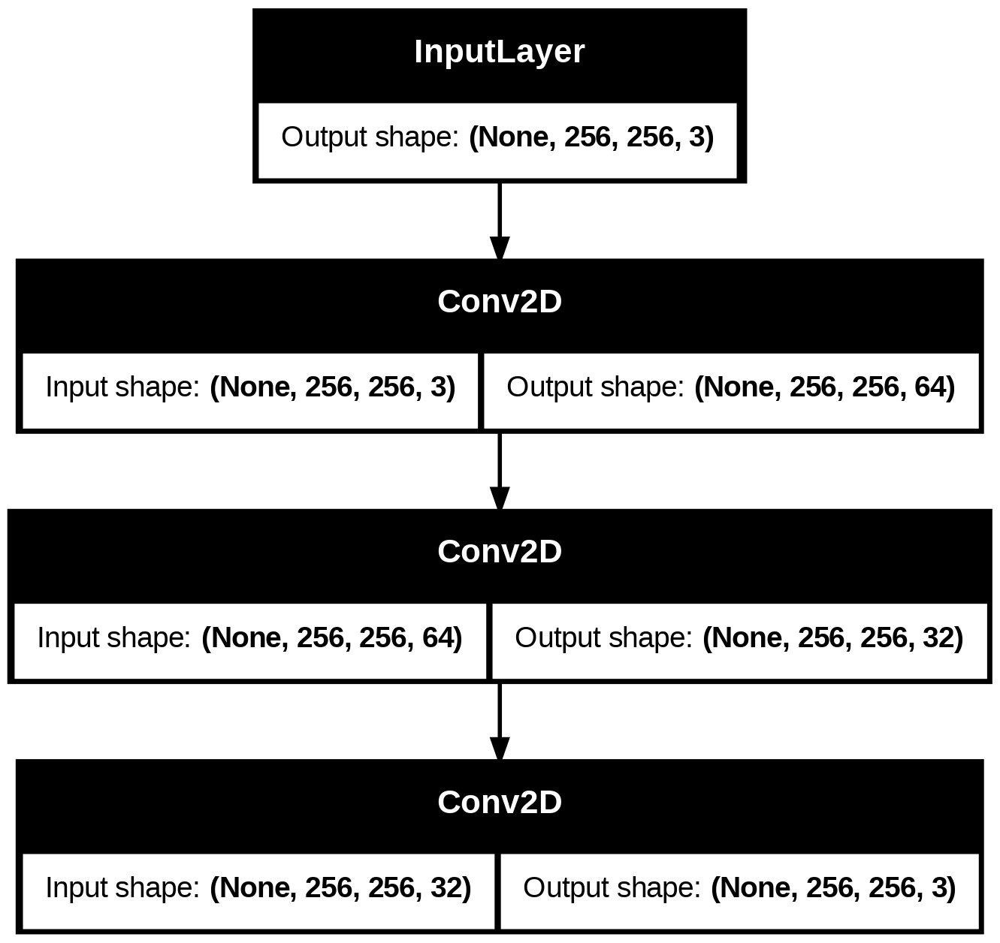

In [5]:
from keras import layers
from tensorflow.keras.utils import plot_model

input_img=Input(shape=(256,256,3))
l1=tf.keras.layers.Conv2D(64,9,padding='same',activation='relu') (input_img)
l2=tf.keras.layers.Conv2D(32,1,padding='same',activation='relu') (l1)
l3=tf.keras.layers.Conv2D(3,5,padding='same',activation='relu') (l2)

SRCNN=Model(input_img,l3)

def pixel_mse_loss(x,y):
    return tf.reduce_mean( (x - y) ** 2 )
SRCNN.compile(optimizer=tf.keras.optimizers.Adam(0.001),loss=pixel_mse_loss)
SRCNN.summary()
plot_model(SRCNN, to_file ='super_res.png',show_shapes=True)

In [6]:
SRCNN.fit(train_low_image, train_high_image, epochs = 20, batch_size = 1,
          validation_data = (validation_low_image,validation_high_image))

Epoch 1/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 23s 18ms/step - loss: 0.0676 - val_loss: 0.0101
Epoch 2/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 29s 10ms/step - loss: 0.0102 - val_loss: 0.0099
Epoch 3/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0101 - val_loss: 0.0100
Epoch 4/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0099 - val_loss: 0.0097
Epoch 5/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0100 - val_loss: 0.0097
Epoch 6/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0097 - val_loss: 0.0097
Epoch 7/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0096 - val_loss: 0.0097
Epoch 8/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0097 - val_loss: 0.0095
Epoch 9/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 0.0095 - val_loss: 0.0097
Epoch 10/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 18s 10ms/step - loss: 0.0097 - val_loss: 0.0095
Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0094 - val_loss: 0.0097
Epoch 12/20
10

In [7]:
from tensorflow.keras.applications import InceptionV3
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import numpy as np

# Function to calculate PSNR
def calculate_psnr(y_true, y_pred):
    return peak_signal_noise_ratio(y_true, y_pred)

# Function to calculate SSIM with data_range and channel_axis
def calculate_ssim(y_true, y_pred):
    return structural_similarity(y_true, y_pred, multichannel=True, win_size=3, data_range=1.0, channel_axis=2)

# Using InceptionV3 for Inception Score (requires classification model)
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(SIZE, SIZE, 3))

# Function to calculate Frechet Inception Distance (FID)
def calculate_fid(real_images, generated_images):
    act1 = inception_model.predict(real_images)
    act2 = inception_model.predict(generated_images)

    # Mean and covariance of real and generated activations
    mu1, sigma1 = np.mean(act1, axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = np.mean(act2, axis=0), np.cov(act2, rowvar=False)

    # Calculate squared difference between means
    ssdiff = np.sum((mu1 - mu2) ** 2)

    # Product of covariances
    covmean = np.sqrt(sigma1.dot(sigma2))

    return ssdiff + np.trace(sigma1 + sigma2 - 2 * covmean)

# Function to calculate Inception Score
def calculate_inception_score(images, eps=1e-6):
    preds = inception_model.predict(images)
    preds = np.exp(preds - np.max(preds, axis=1, keepdims=True))  # normalize predictions
    kl_div = preds * (np.log(preds + eps) - np.log(np.expand_dims(np.mean(preds, 0), 0) + eps))
    return np.exp(np.mean(np.sum(kl_div, axis=1)))

# Store metrics in lists
psnr_values, ssim_values, fid_values, inception_scores = [], [], [], []

# Evaluating model after each epoch
for i in range(len(test_high_image)):
    predicted = np.clip(SRCNN.predict(test_low_image[i].reshape(1, SIZE, SIZE, 3)), 0.0, 1.0).reshape(SIZE, SIZE, 3)

    # PSNR and SSIM
    psnr_values.append(calculate_psnr(test_high_image[i], predicted))
    ssim_values.append(calculate_ssim(test_high_image[i], predicted))

    # Instead of comparing just one predicted image, calculate FID on the whole batch
    if i % 100 == 0:  # every 100th iteration, evaluate FID
        fid_values.append(calculate_fid(test_high_image[:100], test_low_image[:100]))  # Example: passing a batch of 100 images
        inception_scores.append(calculate_inception_score(test_low_image[:100]))

# Calculating the mean of all metrics
mean_psnr = np.mean(psnr_values)
mean_ssim = np.mean(ssim_values)
mean_fid = np.mean(fid_values)
mean_inception_score = np.mean(inception_scores)

print(f"PSNR: {mean_psnr}")
print(f"SSIM: {mean_ssim}")
print(f"FID: {mean_fid}")
print(f"Inception Score: {mean_inception_score}")


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


<ipython-input-7-eff8ec29fafd>:29: RuntimeWarning: invalid value encountered in sqrt
  covmean = np.sqrt(sigma1.dot(sigma2))


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━

In [8]:
def PSNR(y_true,y_pred):
    mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
    return 20 * log10(1/ (mse ** 0.5))

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def pixel_MSE(y_true,y_pred):
    return tf.reduce_mean( (y_true - y_pred) ** 2 )

def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)

    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


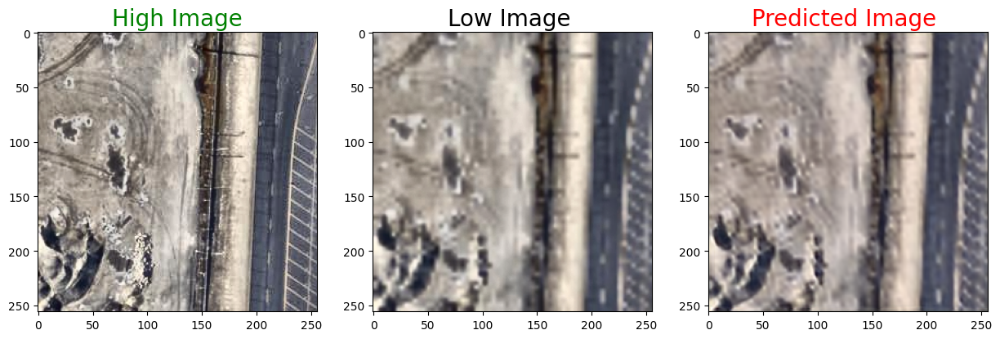

PSNR tf.Tensor(20.771692, shape=(), dtype=float32) dB SSIM tf.Tensor(0.5688503, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


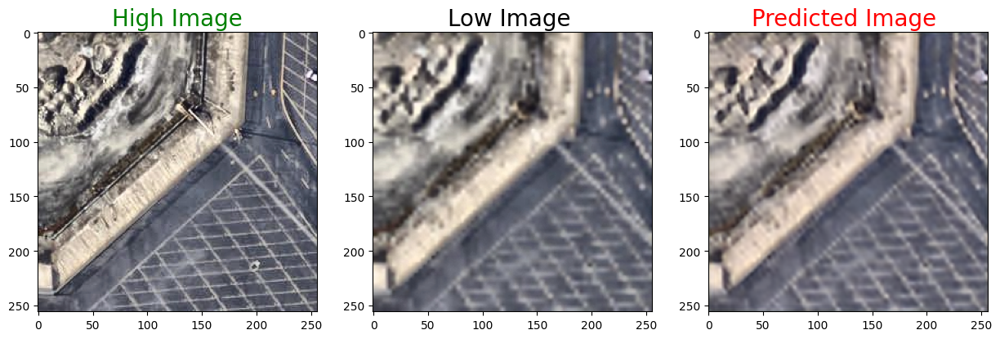

PSNR tf.Tensor(20.481113, shape=(), dtype=float32) dB SSIM tf.Tensor(0.5657874, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


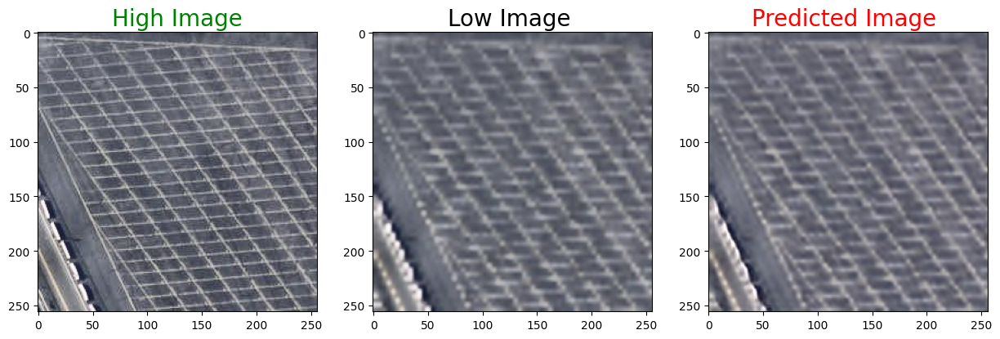

PSNR tf.Tensor(21.501112, shape=(), dtype=float32) dB SSIM tf.Tensor(0.53524035, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


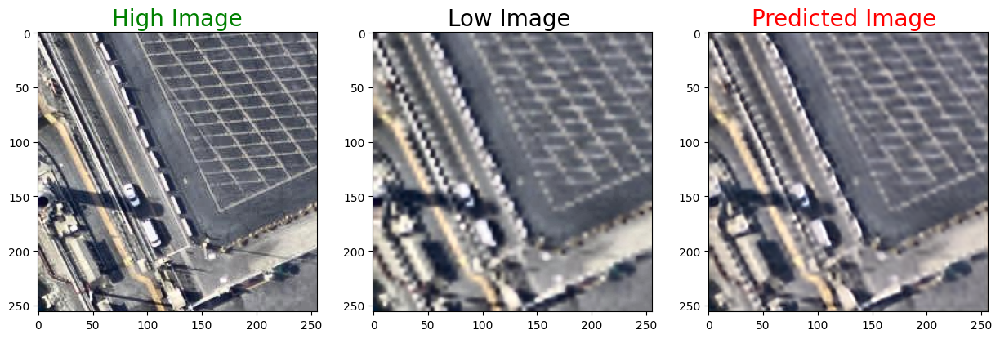

PSNR tf.Tensor(19.567291, shape=(), dtype=float32) dB SSIM tf.Tensor(0.59235334, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


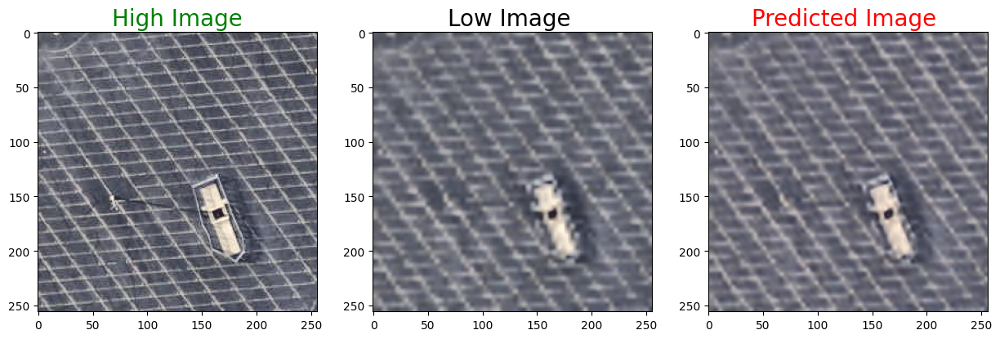

PSNR tf.Tensor(20.684814, shape=(), dtype=float32) dB SSIM tf.Tensor(0.52159655, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


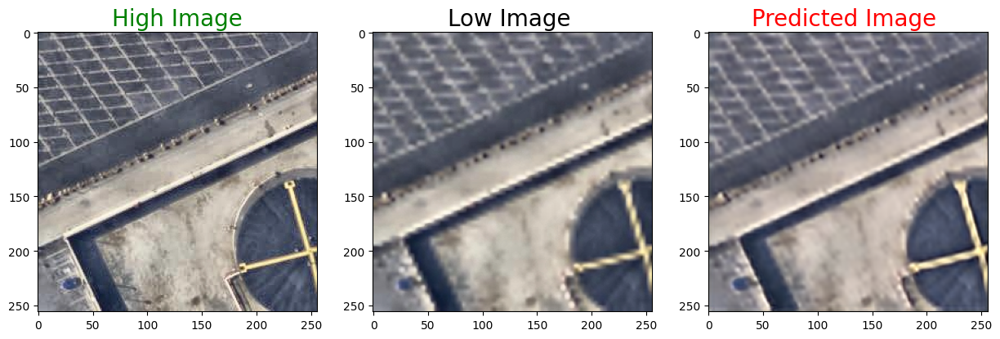

PSNR tf.Tensor(22.96413, shape=(), dtype=float32) dB SSIM tf.Tensor(0.6813398, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


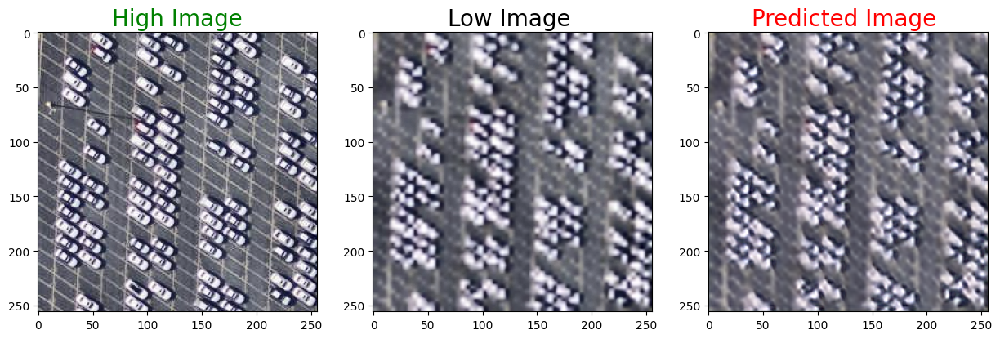

PSNR tf.Tensor(16.798742, shape=(), dtype=float32) dB SSIM tf.Tensor(0.50151145, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


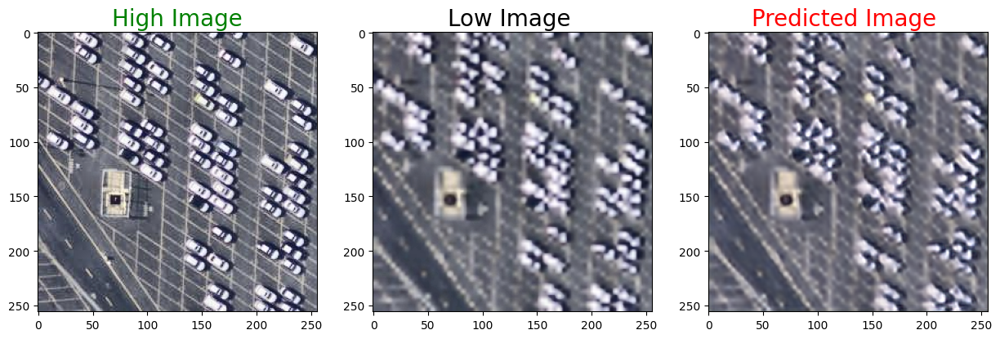

PSNR tf.Tensor(17.79836, shape=(), dtype=float32) dB SSIM tf.Tensor(0.52233446, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


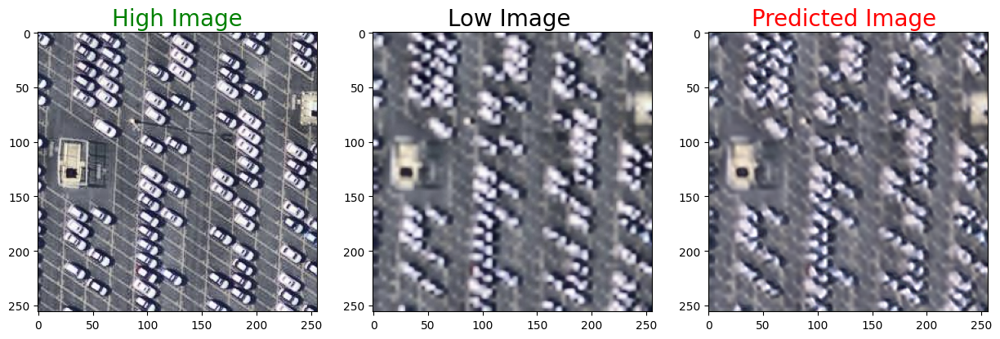

PSNR tf.Tensor(17.135551, shape=(), dtype=float32) dB SSIM tf.Tensor(0.4876856, shape=(), dtype=float32)


In [9]:
for i in range(16,25):
    predicted = np.clip(SRCNN.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)
    print('PSNR',PSNR(test_high_image[i],predicted),'dB', "SSIM",tf.image.ssim(test_high_image[i],predicted,max_val=1))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


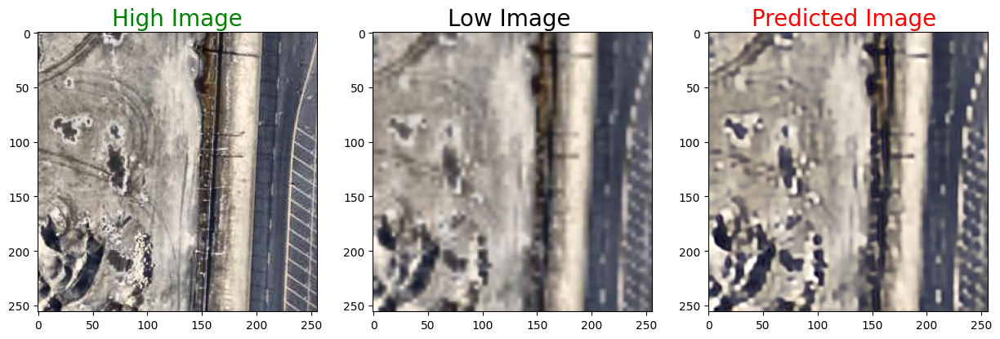

PSNR tf.Tensor(19.720562, shape=(), dtype=float32) dB SSIM tf.Tensor(0.5629097, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


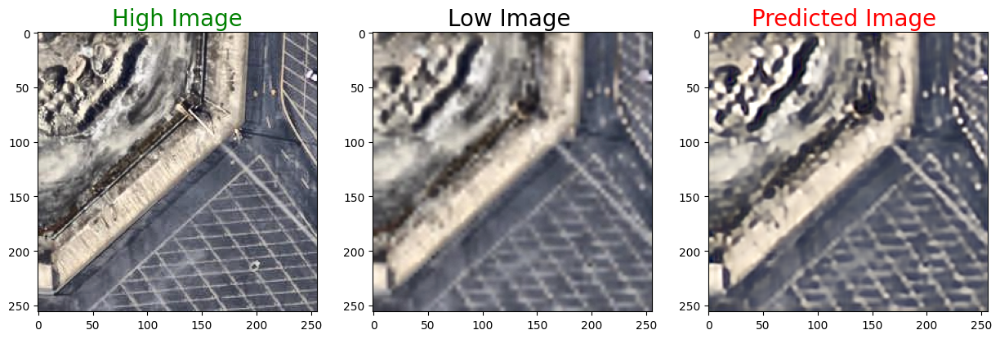

PSNR tf.Tensor(19.460384, shape=(), dtype=float32) dB SSIM tf.Tensor(0.56609195, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


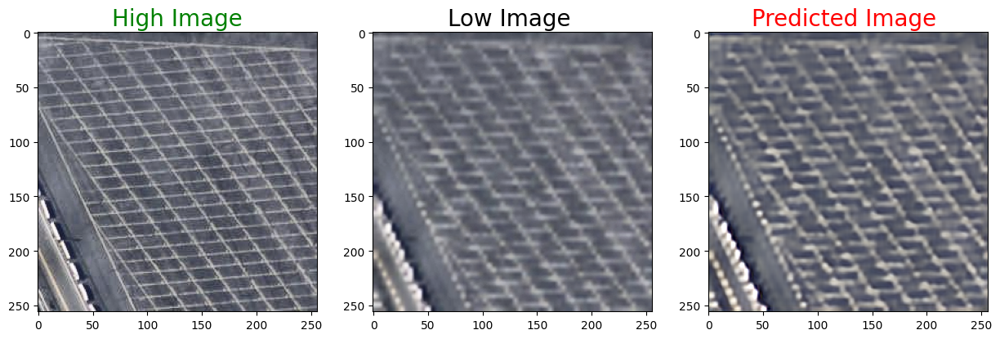

PSNR tf.Tensor(20.277184, shape=(), dtype=float32) dB SSIM tf.Tensor(0.51750594, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


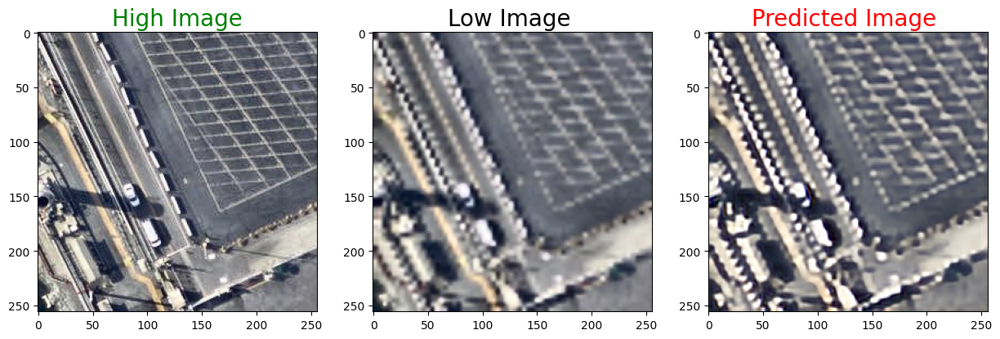

PSNR tf.Tensor(17.323187, shape=(), dtype=float32) dB SSIM tf.Tensor(0.53790003, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


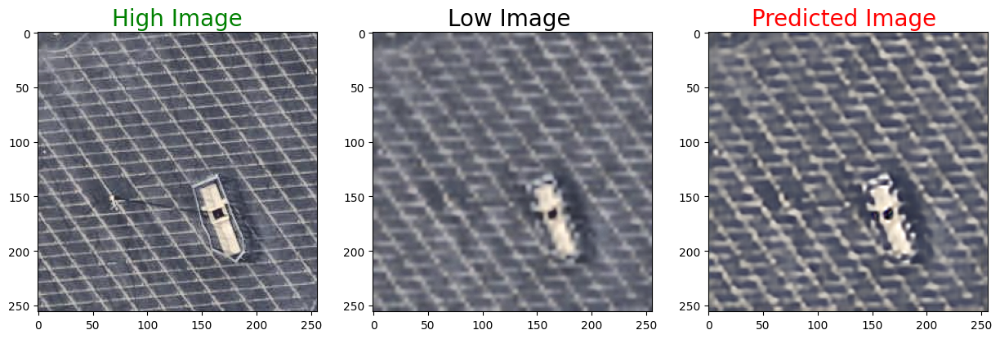

PSNR tf.Tensor(19.734324, shape=(), dtype=float32) dB SSIM tf.Tensor(0.51708287, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


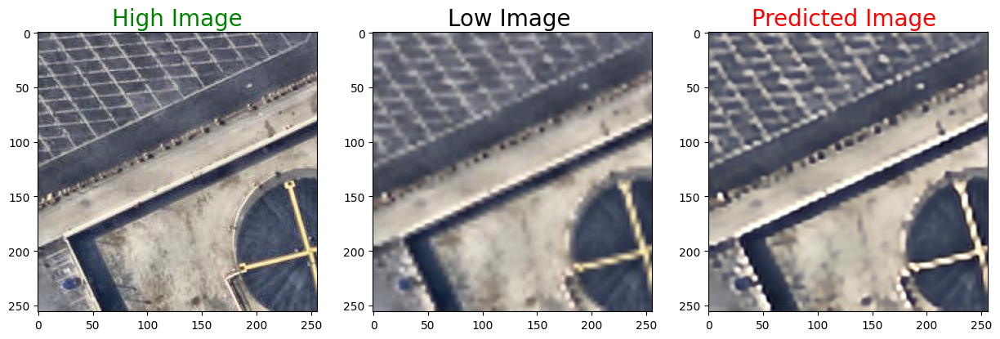

PSNR tf.Tensor(21.48387, shape=(), dtype=float32) dB SSIM tf.Tensor(0.6616702, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


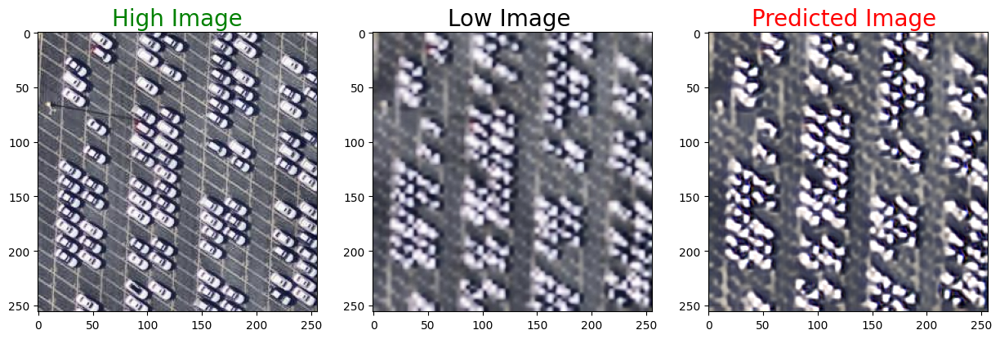

PSNR tf.Tensor(15.086267, shape=(), dtype=float32) dB SSIM tf.Tensor(0.47794977, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


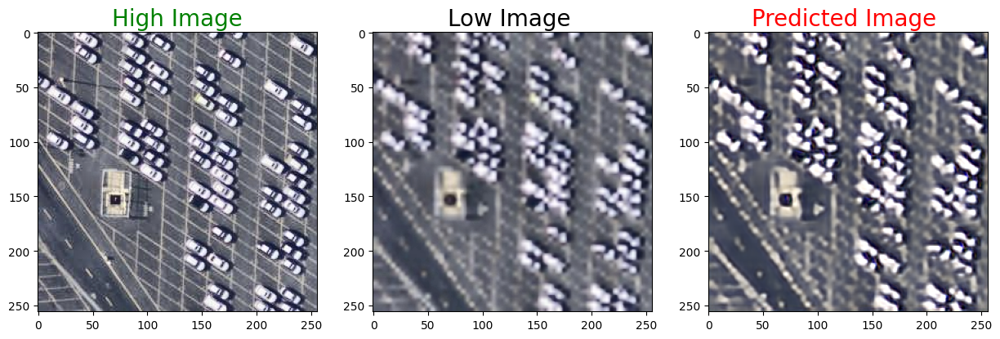

PSNR tf.Tensor(16.278406, shape=(), dtype=float32) dB SSIM tf.Tensor(0.5011397, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


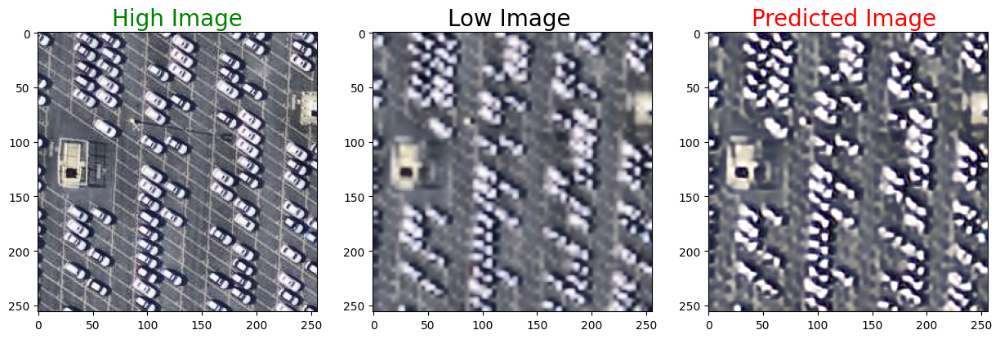

PSNR tf.Tensor(15.585212, shape=(), dtype=float32) dB SSIM tf.Tensor(0.46300063, shape=(), dtype=float32)


In [11]:
from keras.models import load_model
# SRCNN.save("SRCNN_e_"+ "20" +".h5")
loadded_model = load_model('/content/SRCNN_e_20.h5', compile=False)
for i in range(16,25):
    predicted = np.clip(loadded_model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)
    print('PSNR',PSNR(test_high_image[i],predicted),'dB', "SSIM",tf.image.ssim(test_high_image[i],predicted,max_val=1))

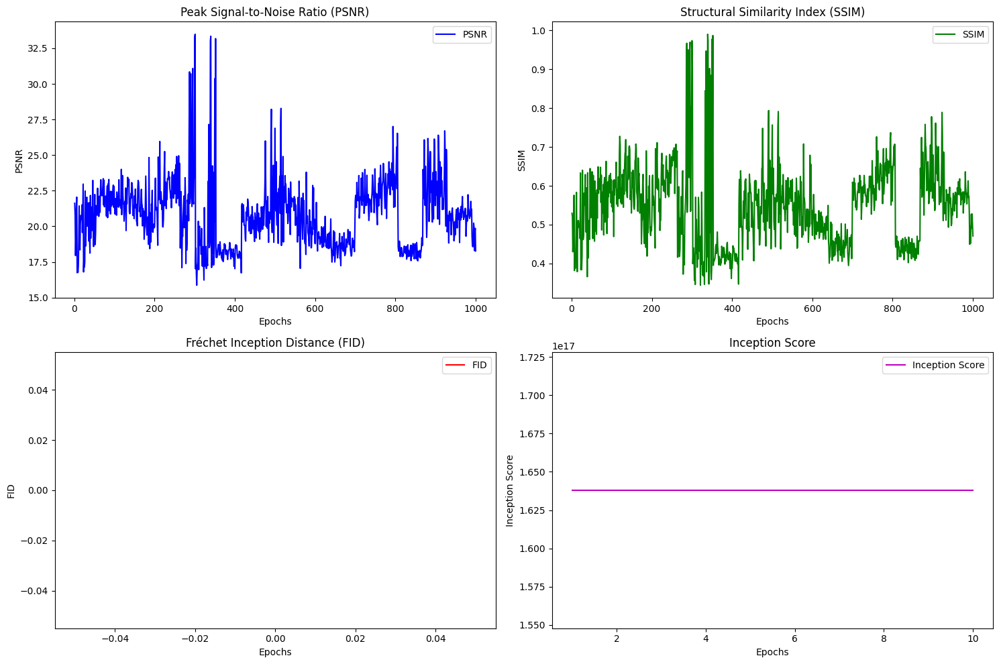

In [12]:
import matplotlib.pyplot as plt

# Assuming 'epochs' is a list of all epochs (e.g., epochs = range(1, 1001))
epochs = list(range(1, len(psnr_values) + 1))  # Assuming PSNR is calculated for every epoch

# Create a subset of 'epochs' for FID and Inception Score where they were calculated
fid_epochs = list(range(1, len(fid_values) + 1))  # Every 100th epoch for FID and Inception Score

plt.figure(figsize=(15, 10))

# PSNR Plot
plt.subplot(2, 2, 1)
plt.plot(epochs, psnr_values, 'b-', label='PSNR')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.title('Peak Signal-to-Noise Ratio (PSNR)')
plt.legend()

# SSIM Plot
plt.subplot(2, 2, 2)
plt.plot(epochs, ssim_values, 'g-', label='SSIM')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.title('Structural Similarity Index (SSIM)')
plt.legend()

# FID Plot - plot only for every 100th epoch
plt.subplot(2, 2, 3)
plt.plot(fid_epochs, fid_values, 'r-', label='FID')
plt.xlabel('Epochs')
plt.ylabel('FID')
plt.title('Fréchet Inception Distance (FID)')
plt.legend()

# Inception Score Plot - plot only for every 100th epoch
plt.subplot(2, 2, 4)
plt.plot(fid_epochs, inception_scores, 'm-', label='Inception Score')
plt.xlabel('Epochs')
plt.ylabel('Inception Score')
plt.title('Inception Score')
plt.legend()

plt.tight_layout()
plt.show()
